# **Forecasting with Linear Regression**

### **Contents**

- **EDA** - A brief EDA, showing the essentials
- **Aggregating Categorical Variables** - A continuation of the EDA, showing that we should be able to forecast the aggregated time series (daily total sales) and then disaggregate the forecasts based on historical proportions and other data without penalising performance.
- **Total Sales Forecast** - Forecast the total number of sales across all categorical variables using Linear Regression for 2017, 2018 and 2019.
- **Product Sales Ratio Forecast** - Forecast the ratio of sales between products for 2017, 2018 and 2019.
- **Dissagregating Total Sales Forecast** - Disagreggate the Total Sales forecasts, to get the forecast for each categorical variable.

# **Preliminaries**

In [79]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import pycountry
import seaborn as sns
import requests
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_percentage_error, make_scorer
from sklearn.model_selection import KFold, ParameterGrid
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from xgboost import XGBRegressor

sns.set_style('darkgrid')

In [2]:
train_df = pd.read_csv("data/train.csv", parse_dates=["date"])
original_train_df = train_df.copy()
test_df = pd.read_csv("data/test.csv", parse_dates=["date"])

# **EDA**

## **Categorical variables**

In [3]:
display(train_df.head(3))
display(test_df.head(3))

,id,date,country,store,product,num_sold
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0


,id,date,country,store,product
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers


**Observations:**
- There are 3 categorical columns that together describe a univariate time series. Country, Store and Product.

Lets see which countries, stores and products we have data for:

In [4]:
def get_val_counts(df, column_name, sort_by_column_name=False):
    value_count = df[column_name].value_counts().reset_index().rename(columns={column_name:column_name,"index":column_name}).set_index(column_name)
    value_count["Percentage"] = df[column_name].value_counts(normalize=True)*100
    value_count = value_count.reset_index()
    if sort_by_column_name:
        value_count = value_count.sort_values(column_name)
    return value_count

def plot_value_counts_pie(df, column_name, sort_by_column_name=False):
    val_count_df = get_val_counts(df, column_name, sort_by_column_name)
    val_count.set_index(column_name).plot.pie(y="Value Count", figsize=(5,5), legend=False, ylabel="");

def plot_value_counts_bar(df, column_name, sort_by_column_name = False):
    val_count_df = get_val_counts(df, column_name, sort_by_column_name)
    f,ax = plt.subplots(figsize=(12,6))
    sns.barplot(data = val_count_df, y="count", x=column_name )

    for index, row in val_count_df.iterrows():
        count = row["count"]
        percentage = row["Percentage"]
        ax.text(
            x=index, 
            y=row["count"] + max(val_count_df["count"])*0.02,  # Adjust position slightly above the bar
            s=f'{count} ({percentage:.2f}%)', 
            ha='center', 
            va='bottom'
        )

In [5]:
counts = train_df.groupby(["country","store","product"])["num_sold"].count().rename("num_rows")
missing_data = counts.loc[counts != 2557]
missing_data_df = missing_data.reset_index()
missing_data_df["num_missing_rows"] = 2557 - missing_data_df["num_rows"]
missing_data_df

,country,store,product,num_rows,num_missing_rows
0,Canada,Discount Stickers,Holographic Goose,0,2557
1,Canada,Discount Stickers,Kerneler,2556,1
2,Canada,Premium Sticker Mart,Holographic Goose,2177,380
3,Canada,Stickers for Less,Holographic Goose,1249,1308
4,Kenya,Discount Stickers,Holographic Goose,0,2557
5,Kenya,Discount Stickers,Kerneler,2494,63
6,Kenya,Discount Stickers,Kerneler Dark Mode,2556,1
7,Kenya,Premium Sticker Mart,Holographic Goose,1911,646
8,Kenya,Stickers for Less,Holographic Goose,1199,1358


## **Country**

First we show that its a good idea to aggregate **countries** when we make the forecast.

To do this we need to show that the proportion of total sales for each country remains constant, regardless of time.

In the graph below, we are looking for straight lines for each country:



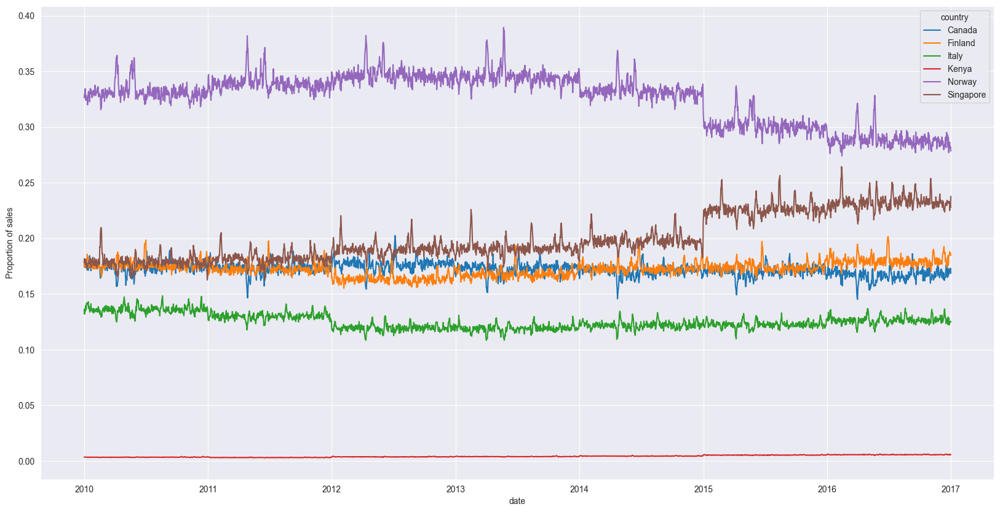

In [6]:
country_weights = train_df.groupby("country")["num_sold"].sum()/train_df["num_sold"].sum()

country_ratio_over_time = (train_df.groupby(["date","country"])["num_sold"].sum() / train_df.groupby(["date"])["num_sold"].sum()).reset_index()
f,ax = plt.subplots(figsize=(20,10))
sns.lineplot(data = country_ratio_over_time, x="date", y="num_sold", hue="country");
ax.set_ylabel("Proportion of sales");

**Observations:**
- The lines are **not** perflectly straight, meaning a single constant does not explain the proportion of sales regardless of time.
- The lines for each country do seem to have rises and falls each year (noteably exactly at the year markings) something artificially strange is going on here.

The link seems to be GDP per captia, credit to [@siukeitin](https://www.kaggle.com/siukeitin) for discovering this in this discussion thread https://www.kaggle.com/competitions/playground-series-s5e1/discussion/554349

In [7]:
def get_gdp_per_capita(alpha3, year):
    url='https://api.worldbank.org/v2/country/{0}/indicator/NY.GDP.PCAP.CD?date={1}&format=json'
    response = requests.get(url.format(alpha3,year)).json()
    return response[1][0]['value']

df = train_df[['date', 'country']].copy()
alpha3s = ['CAN', 'FIN', 'ITA', 'KEN', 'NOR', 'SGP']
df['alpha3'] = df['country'].map(dict(zip(
    np.sort(df['country'].unique()), alpha3s)))
years =  ["2010", "2011", "2012", "2013", "2014", "2015", "2016", "2017", "2018", "2019", "2020"]
df['year'] = df['date'].dt.year
gdp = np.array([
    [get_gdp_per_capita(alpha3, year) for year in years]
    for alpha3 in alpha3s
])
gdp = pd.DataFrame(gdp, index=alpha3s, columns=years)
gdp

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
CAN,47560.666601,52223.858840,52670.344734,52638.118724,50960.843117,43594.194105,42314.061582,45129.628117,46539.176157,46352.869345,43537.839299
FIN,46506.291902,51060.324259,47551.674084,49691.014520,50073.776082,42560.345677,43451.256244,46085.017474,49654.249704,48358.180777,48828.684686
ITA,36184.711870,38851.388134,35235.798906,35747.707953,35750.719750,30387.129319,31126.324695,32554.146685,34746.344139,33812.788725,32091.486662
KEN,1091.518731,1096.144998,1285.005362,1370.878852,1482.815663,1489.119598,1554.126103,1667.484472,1836.452755,1960.408089,1927.664590
NOR,88163.208593,101221.813477,102175.919298,103553.840134,97666.695184,74809.965805,70867.360997,76131.838403,82792.842711,76430.588947,68340.018103
SGP,47236.683085,53891.457026,55547.555308,56967.425794,57564.802311,55645.606861,56899.918181,61162.097393,66840.637339,66081.719924,61466.803676


In [8]:
gdp_per_capita_filtered_df = gdp

for year in years:
    gdp_per_capita_filtered_df[f"{year}_ratio"] = gdp_per_capita_filtered_df[year] / gdp_per_capita_filtered_df.sum()[year]

gdp_per_capita_filtered_ratios_df = gdp_per_capita_filtered_df[[i+"_ratio" for i in years]]
gdp_per_capita_filtered_ratios_df.columns = [int(i) for i in years]
gdp_per_capita_filtered_ratios_df = gdp_per_capita_filtered_ratios_df.unstack().reset_index().rename(columns = {"level_0": "year", 0: "ratio", "Country Name": "country"})
gdp_per_capita_filtered_ratios_df['year'] = pd.to_datetime(gdp_per_capita_filtered_ratios_df['year'], format='%Y')

gdp_per_capita_filtered_ratios_df = gdp_per_capita_filtered_ratios_df.rename(columns = {"level_1": "country"})


# For plotting purposes
gdp_per_capita_filtered_ratios_df_2 = gdp_per_capita_filtered_ratios_df.copy()
gdp_per_capita_filtered_ratios_df_2["year"] = pd.to_datetime(gdp_per_capita_filtered_ratios_df_2['year'].astype(str)) + pd.offsets.YearEnd(1)
gdp_per_capita_filtered_ratios_df = pd.concat([gdp_per_capita_filtered_ratios_df, gdp_per_capita_filtered_ratios_df_2]).reset_index()

gdp_per_capita_filtered_ratios_df

,index,year,country,ratio
0,0,2010-01-01,CAN,0.178301
1,1,2010-01-01,FIN,0.174349
2,2,2010-01-01,ITA,0.135654
3,3,2010-01-01,KEN,0.004092
4,4,2010-01-01,NOR,0.330517
...,...,...,...,...
127,61,2020-12-31,FIN,0.190594
128,62,2020-12-31,ITA,0.125263
129,63,2020-12-31,KEN,0.007524
130,64,2020-12-31,NOR,0.266753


In [9]:
def get_country_name(alpha_3):
    try:
        country = pycountry.countries.get(alpha_3=alpha_3.upper())
        return country.name if country else "Invalid Code"
    except Exception as e:
        return str(e)

gdp_per_capita_filtered_ratios_df_2["year"] = gdp_per_capita_filtered_ratios_df_2["year"].dt.year
gdp_per_capita_filtered_ratios_df_2['country_name'] = gdp_per_capita_filtered_ratios_df_2['country'].apply(get_country_name)


### Imputing

Here we use the ratio from Norway to Canada and Norway to Kenya to impute missing values. Norway is selected as it has consistent values across products and stores without major outliers. 

In [10]:
train_df_imputed = train_df.copy()
print(f"Missing values remaining: {train_df_imputed['num_sold'].isna().sum()}")

train_df_imputed["year"] = train_df_imputed["date"].dt.year
for year in train_df_imputed["year"].unique():
    # Impute Time Series 1 (Canada, Discount Stickers, Holographic Goose)
    target_ratio = gdp_per_capita_filtered_ratios_df_2.loc[(gdp_per_capita_filtered_ratios_df_2["year"] == year) & (gdp_per_capita_filtered_ratios_df_2["country_name"] == "Norway"), "ratio"].values[0] # Using Norway as should have the best precision
    current_raito = gdp_per_capita_filtered_ratios_df_2.loc[(gdp_per_capita_filtered_ratios_df_2["year"] == year) & (gdp_per_capita_filtered_ratios_df_2["country_name"] == "Canada"), "ratio"].values[0]
    ratio_can = current_raito / target_ratio
    train_df_imputed.loc[(train_df_imputed["country"] == "Canada") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year), "num_sold"] * ratio_can).values
    
    # Impute Time Series 2 (Only Missing Values)
    current_ts =  train_df_imputed.loc[(train_df_imputed["country"] == "Canada") & (train_df_imputed["store"] == "Premium Sticker Mart") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    train_df_imputed.loc[(train_df_imputed["country"] == "Canada") & (train_df_imputed["store"] == "Premium Sticker Mart") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Premium Sticker Mart") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_can).values

    # Impute Time Series 3 (Only Missing Values)
    current_ts =  train_df_imputed.loc[(train_df_imputed["country"] == "Canada") & (train_df_imputed["store"] == "Stickers for Less") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    train_df_imputed.loc[(train_df_imputed["country"] == "Canada") & (train_df_imputed["store"] == "Stickers for Less") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Stickers for Less") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_can).values
    
    # Impute Time Series 4 (Kenya, Discount Stickers, Holographic Goose)
    current_raito = gdp_per_capita_filtered_ratios_df_2.loc[(gdp_per_capita_filtered_ratios_df_2["year"] == year) & (gdp_per_capita_filtered_ratios_df_2["country_name"] == "Kenya"), "ratio"].values[0]
    ratio_ken = current_raito / target_ratio
    train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Holographic Goose")& (train_df_imputed["year"] == year), "num_sold"] * ratio_ken).values

    # Impute Time Series 5 (Only Missing Values)
    current_ts = train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Premium Sticker Mart") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Premium Sticker Mart") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Premium Sticker Mart") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_ken).values

    # Impute Time Series 6 (Only Missing Values)
    current_ts = train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Stickers for Less") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Stickers for Less") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Stickers for Less") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_ken).values

    # Impute Time Series 7 (Only Missing Values)
    current_ts = train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Kerneler") & (train_df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Kerneler") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Kerneler") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_ken).values
    
print(f"Missing values remaining: {train_df_imputed['num_sold'].isna().sum()}")

Missing values remaining: 8871
Missing values remaining: 2


It seems a bit overkill to replace the entire timeseries for the remaining 2 missing values, I'll just fill them in manually using the graphs from earlier:

In [11]:
missing_rows = train_df_imputed.loc[train_df_imputed["num_sold"].isna()]
display(missing_rows)
train_df_imputed.loc[train_df_imputed["id"] == 23719, "num_sold"] = 4
train_df_imputed.loc[train_df_imputed["id"] == 207003, "num_sold"] = 195

print(f"Missing values remaining: {train_df_imputed['num_sold'].isna().sum()}")

,id,date,country,store,product,num_sold,year
23719,23719,2010-09-21,Kenya,Discount Stickers,Kerneler Dark Mode,NaN,2010
207003,207003,2016-04-19,Canada,Discount Stickers,Kerneler,NaN,2016


Missing values remaining: 0


### **Store**

Lets test to see if the pattern between stores is the same, regardless of product or country.

In [12]:
store_weights = train_df_imputed.groupby("store")["num_sold"].sum()/train_df_imputed["num_sold"].sum()
store_weights

store
Discount Stickers       0.184710
Premium Sticker Mart    0.441570
Stickers for Less       0.373719
Name: num_sold, dtype: float64

### **Product**

Product requires a different approach

In [13]:
product_df = train_df_imputed.groupby(["date","product"])["num_sold"].sum().reset_index()

In [14]:
product_ratio_df = product_df.pivot(index="date", columns="product", values="num_sold")
product_ratio_df = product_ratio_df.apply(lambda x: x/x.sum(),axis=1)
product_ratio_df = product_ratio_df.stack().rename("ratios").reset_index()
product_ratio_df.head(4)

,date,product,ratios
0,2010-01-01,Holographic Goose,0.052433
1,2010-01-01,Kaggle,0.329308
2,2010-01-01,Kaggle Tiers,0.291168
3,2010-01-01,Kerneler,0.152374


## **Aggregated Time Series**

Lets take a look at the aggregated time series.

In [15]:
original_train_df_imputed = train_df_imputed.copy()
train_df_imputed = train_df_imputed.groupby(["date"])["num_sold"].sum().reset_index()

# **Modeling**

We required 2 forecasts:

1. **Total Sales** Forecast
2. **Product Sales Ratio** Forecast

## **Total Sales Forecast**

Lets do a bit of feature engineering. There's probably room for improvement here:

In [16]:
#get the dates to forecast for
test_total_sales_df = test_df.groupby(["date"])["id"].first().reset_index().drop(columns="id")
#keep dates for later
test_total_sales_dates = test_total_sales_df[["date"]]

In [17]:
def feature_engineer(df):
    new_df = df.copy()
    new_df["month"] = df["date"].dt.month
    new_df["month_sin"] = np.sin(new_df['month'] * (2 * np.pi / 12))
    new_df["month_cos"] = np.cos(new_df['month'] * (2 * np.pi / 12))
    new_df["day_of_week"] = df["date"].dt.dayofweek
    new_df["day_of_week"] = new_df["day_of_week"].apply(lambda x: 0 if x<=3 else(1 if x==4 else (2 if x==5 else (3))))
    
    new_df["day_of_year"] = df['date'].apply(
        lambda x: x.timetuple().tm_yday if not (x.is_leap_year and x.month > 2) else x.timetuple().tm_yday - 1
    )
    
    new_df['day_sin4'] = np.sin(new_df['day_of_year'] * (8 * np.pi /  365.0))
    new_df['day_cos4'] = np.cos(new_df['day_of_year'] * (8 * np.pi /  365.0))
    new_df['day_sin3'] = np.sin(new_df['day_of_year'] * (6 * np.pi /  365.0))
    new_df['day_cos3'] = np.cos(new_df['day_of_year'] * (6 * np.pi /  365.0))
    new_df['day_sin2'] = np.sin(new_df['day_of_year'] * (4 * np.pi /  365.0))
    new_df['day_cos2'] = np.cos(new_df['day_of_year'] * (4 * np.pi /  365.0))
    new_df['day_sin'] = np.sin(new_df['day_of_year'] * (2 * np.pi /  365.0))
    new_df['day_cos'] = np.cos(new_df['day_of_year'] * (2 * np.pi /  365.0)) 
    new_df['day_sin_0.5'] = np.sin(new_df['day_of_year'] * (1 * np.pi /  365.0))
    new_df['day_cos_0.5'] = np.cos(new_df['day_of_year'] * (1 * np.pi /  365.0)) 

    #new_df['week_of_year'] = new_df['date'].dt.isocalendar().week
    
    new_df["important_dates"] = new_df["day_of_year"].apply(lambda x: x if x in [1,2,3,4,5,6,7,8,9,10,99, 100, 101, 125,126,355,256,357,358,359,360,361,362,363,364,365] else 0)
    #new_df["year"] = df["date"].dt.year - 2010
    
    new_df = new_df.drop(columns=["date","month","day_of_year"])
    new_df = pd.get_dummies(new_df, columns = ["important_dates","day_of_week"], drop_first=True)
    
    return new_df

In [18]:
train_total_sales_df = feature_engineer(train_df_imputed)
test_total_sales_df = feature_engineer(test_total_sales_df)

In [19]:
display(train_total_sales_df.head(2))
display(test_total_sales_df.head(2))

,num_sold,month_sin,month_cos,day_sin4,day_cos4,day_sin3,day_cos3,day_sin2,day_cos2,day_sin,...,important_dates_359,important_dates_360,important_dates_361,important_dates_362,important_dates_363,important_dates_364,important_dates_365,day_of_week_1,day_of_week_2,day_of_week_3
0,85710.030833,0.5,0.866025,0.068802,0.997630,0.051620,0.998667,0.034422,0.999407,0.017213,...,False,False,False,False,False,False,False,True,False,False
1,82699.204783,0.5,0.866025,0.137279,0.990532,0.103102,0.994671,0.068802,0.997630,0.034422,...,False,False,False,False,False,False,False,False,True,False


,month_sin,month_cos,day_sin4,day_cos4,day_sin3,day_cos3,day_sin2,day_cos2,day_sin,day_cos,...,important_dates_359,important_dates_360,important_dates_361,important_dates_362,important_dates_363,important_dates_364,important_dates_365,day_of_week_1,day_of_week_2,day_of_week_3
0,0.5,0.866025,0.068802,0.997630,0.051620,0.998667,0.034422,0.999407,0.017213,0.999852,...,False,False,False,False,False,False,False,False,False,True
1,0.5,0.866025,0.137279,0.990532,0.103102,0.994671,0.068802,0.997630,0.034422,0.999407,...,False,False,False,False,False,False,False,False,False,False


In [20]:
y = train_total_sales_df["num_sold"]
X = train_total_sales_df.drop(columns="num_sold")
X_test = test_total_sales_df

In [21]:

mape_scorer = make_scorer(mean_absolute_percentage_error, greater_is_better=False)

### XGBoost Regressor

In [22]:
xgb_params = {
        'n_estimators': list(range(215,230, 5)),
        'max_depth': [1],
        'learning_rate': [0.05, 0.07, 0.09],
        'gamma': [0],
        'subsample': [0.7, 0.8, 0.9],
        'reg_alpha': [0.1, .15, 0.2], 
        'reg_lambda': [0.07, 0.1],
        'colsample_bytree': [0.8, 0.9],
        }

xgb = XGBRegressor()

# Setup K-Fold Cross-Validation
kf = KFold(n_splits=3, shuffle=True, random_state=42)

best_score = float('inf')
best_params = None

# Iterate over parameter combinations
for params in ParameterGrid(xgb_params):
    scores = []
    
    for train_idx, val_idx in kf.split(X):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        # Train the model
        model = XGBRegressor(**params)
        model.fit(X_train, y_train)
        
        # Evaluate on validation set
        preds = model.predict(X_val)
        score = mean_absolute_percentage_error(y_val, preds)
        scores.append(score)
    
    # Average score across folds
    avg_score = np.mean(scores)
    
    # Keep track of the best parameters
    if avg_score < best_score:
        best_score = avg_score
        best_params = params

print("Best Parameters:", best_params)
print("Best MAPE: {:.2f}%".format(best_score * 100))

Best Parameters: {'colsample_bytree': 0.9, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 1, 'n_estimators': 225, 'reg_alpha': 0.15, 'reg_lambda': 0.1, 'subsample': 0.9}
Best MAPE: 7.11%


In [23]:
xgb_params = best_params

### SV Regression

In [24]:
svm_params = {'C': [23,25,27], 
            'gamma': [0.1], 
            'kernel': ['linear']} 

svr = SVR()

svr_grid = GridSearchCV(svr, svm_params, cv=3, scoring='neg_mean_absolute_percentage_error', verbose=2)

svr_grid.fit(X, y)

# Print the best parameters and the best score
print("Best parameters found: ", svr_grid.best_params_)
print("Best score found: ", svr_grid.best_score_)

Fitting 3 folds for each of 3 candidates, totalling 9 fits
[CV] END .....................C=23, gamma=0.1, kernel=linear; total time=   0.1s
[CV] END .....................C=23, gamma=0.1, kernel=linear; total time=   0.1s
[CV] END .....................C=23, gamma=0.1, kernel=linear; total time=   0.1s
[CV] END .....................C=25, gamma=0.1, kernel=linear; total time=   0.1s
[CV] END .....................C=25, gamma=0.1, kernel=linear; total time=   0.1s
[CV] END .....................C=25, gamma=0.1, kernel=linear; total time=   0.1s
[CV] END .....................C=27, gamma=0.1, kernel=linear; total time=   0.1s
[CV] END .....................C=27, gamma=0.1, kernel=linear; total time=   0.1s
[CV] END .....................C=27, gamma=0.1, kernel=linear; total time=   0.1s
Best parameters found:  {'C': 25, 'gamma': 0.1, 'kernel': 'linear'}
Best score found:  -0.09916572179504506


### Random Forest Regression

In [25]:
rf_params = {'n_estimators': [146,147,149],
        'max_depth': [16],
        'min_samples_split': [2], # determines depth of the tree based on internal nodes
        'min_samples_leaf': [2] # determines depth of the tree based on leaves (nodes without children)
        }

rf = RandomForestRegressor()

# grid search for each estimator
rf_grid = GridSearchCV(rf, rf_params, cv=3, scoring='neg_mean_absolute_percentage_error', verbose=2)

rf_grid.fit(X, y)

# Print the best parameters and the best score
print("Best parameters found: ", rf_grid.best_params_)
print("Best score found: ", rf_grid.best_score_)

Fitting 3 folds for each of 3 candidates, totalling 9 fits
[CV] END max_depth=16, min_samples_leaf=2, min_samples_split=2, n_estimators=146; total time=   1.0s
[CV] END max_depth=16, min_samples_leaf=2, min_samples_split=2, n_estimators=146; total time=   1.1s
[CV] END max_depth=16, min_samples_leaf=2, min_samples_split=2, n_estimators=146; total time=   1.0s
[CV] END max_depth=16, min_samples_leaf=2, min_samples_split=2, n_estimators=147; total time=   1.0s
[CV] END max_depth=16, min_samples_leaf=2, min_samples_split=2, n_estimators=147; total time=   1.0s
[CV] END max_depth=16, min_samples_leaf=2, min_samples_split=2, n_estimators=147; total time=   1.1s
[CV] END max_depth=16, min_samples_leaf=2, min_samples_split=2, n_estimators=149; total time=   1.0s
[CV] END max_depth=16, min_samples_leaf=2, min_samples_split=2, n_estimators=149; total time=   1.0s
[CV] END max_depth=16, min_samples_leaf=2, min_samples_split=2, n_estimators=149; total time=   1.0s
Best parameters found:  {'max_de

### KNN Regression

In [26]:
knn_params = {
    'n_neighbors': list(range(1, 10,1)),
    'weights': ['distance','uniform'],
    #'leaf_size': [1,3,5],#[5,10,15],#[10,20],# ,30,40],
    'algorithm': ['auto'], #['ball_tree', 'kd_tree'],
    'metric': ['manhattan'] #,  'chebyshev'] #
}

knn = KNeighborsRegressor()

knn_grid = GridSearchCV(knn, knn_params, cv=3, scoring='neg_mean_absolute_percentage_error', verbose=2)

knn_grid.fit(X, y)

# Print the best parameters and the best score
print("Best parameters found: ", knn_grid.best_params_)
print("Best score found: ", knn_grid.best_score_)

Fitting 3 folds for each of 18 candidates, totalling 54 fits
[CV] END algorithm=auto, metric=manhattan, n_neighbors=1, weights=distance; total time=   0.1s
[CV] END algorithm=auto, metric=manhattan, n_neighbors=1, weights=distance; total time=   0.1s
[CV] END algorithm=auto, metric=manhattan, n_neighbors=1, weights=distance; total time=   0.2s
[CV] END algorithm=auto, metric=manhattan, n_neighbors=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, metric=manhattan, n_neighbors=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, metric=manhattan, n_neighbors=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, metric=manhattan, n_neighbors=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, metric=manhattan, n_neighbors=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, metric=manhattan, n_neighbors=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, metric=manhattan, n_neighbors=2, weights=uniform; total time= 

### AdaBoost Regressor

In [27]:
ada_param_grid = {
    'n_estimators': [90, 100, 110],  # Number of weak learners
    'learning_rate': [0.8, .9, 1],  # Learning rate
    'loss': ['exponential']  # Loss function options
}

ada = AdaBoostRegressor()

ada_grid = GridSearchCV(ada, ada_param_grid, cv=3, scoring='neg_mean_absolute_percentage_error', verbose=2)

ada_grid.fit(X, y)

# Print the best parameters and the best score
print("Best parameters found: ", ada_grid.best_params_)
print("Best score found: ", ada_grid.best_score_)

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV] END learning_rate=0.8, loss=exponential, n_estimators=90; total time=   0.2s
[CV] END learning_rate=0.8, loss=exponential, n_estimators=90; total time=   0.2s
[CV] END learning_rate=0.8, loss=exponential, n_estimators=90; total time=   0.2s
[CV] END learning_rate=0.8, loss=exponential, n_estimators=100; total time=   0.2s
[CV] END learning_rate=0.8, loss=exponential, n_estimators=100; total time=   0.2s
[CV] END learning_rate=0.8, loss=exponential, n_estimators=100; total time=   0.3s
[CV] END learning_rate=0.8, loss=exponential, n_estimators=110; total time=   0.3s
[CV] END learning_rate=0.8, loss=exponential, n_estimators=110; total time=   0.3s
[CV] END learning_rate=0.8, loss=exponential, n_estimators=110; total time=   0.2s
[CV] END learning_rate=0.9, loss=exponential, n_estimators=90; total time=   0.2s
[CV] END learning_rate=0.9, loss=exponential, n_estimators=90; total time=   0.2s
[CV] END learning_rate=0.9, loss

### Ridge Regressor

In [36]:
ridge = Ridge()
ridge_param_grid = {
    'alpha': [0.05, 0.06, 0.04],  # Regularization strength
}

ridge_grid_search = GridSearchCV(ridge, ridge_param_grid, cv=3, scoring='neg_mean_absolute_percentage_error')
ridge_grid_search.fit(X, y)

print("Best Parameters for Ridge:", ridge_grid_search.best_params_)
print("Best Score for Ridge:", -ridge_grid_search.best_score_)

Best Parameters for Ridge: {'alpha': 0.05}
Best Score for Ridge: 0.08997403894073608


### Lasso Regressor

In [43]:
lasso = Lasso()
lasso_param_grid = {
    'alpha': [0.001],  # Regularization strength
    'max_iter': [1,50,100,200,500],  # Iteration limits
}

lasso_grid_search = GridSearchCV(lasso, lasso_param_grid, cv=3, scoring='neg_mean_absolute_percentage_error')
lasso_grid_search.fit(X, y)

print("Best Parameters for Lasso:", lasso_grid_search.best_params_)
print("Best Score for Lasso:", -lasso_grid_search.best_score_)

Best Parameters for Lasso: {'alpha': 0.001, 'max_iter': 50}
Best Score for Lasso: 0.08997202486944271


/Users/andrewbennett/Documents/projects/sticker-sales-forecast/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.136e+10, tolerance: 9.393e+06
  model = cd_fast.enet_coordinate_descent(
/Users/andrewbennett/Documents/projects/sticker-sales-forecast/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.730e+10, tolerance: 1.059e+07
  model = cd_fast.enet_coordinate_descent(
/Users/andrewbennett/Documents/projects/sticker-sales-forecast/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not c

In [44]:
best_params = [lasso_grid_search.best_params_, ridge_grid_search.best_params_, knn_grid.best_params_, rf_grid.best_params_, ada_grid.best_params_, svr_grid.best_params_, xgb_params]
model_names = ['Lasso', 'Ridge', 'KNN', 'Random Forest', 'AdaBoost', 'SVR', 'XGB']
models = []

for index in range(len(best_params)):
    model = None

    if model_names[index] == 'XGB':
        model = XGBRegressor(**best_params[index])
    elif model_names[index] == 'SVR':
        model = SVR(**best_params[index])
    elif model_names[index] == 'Ridge':
        model = Ridge(**best_params[index])
    elif model_names[index] == 'Lasso':
        model = Lasso(**best_params[index])
    elif model_names[index] == 'KNN':
        model = KNeighborsRegressor(**best_params[index])
    elif model_names[index] == 'Random Forest':
        model = RandomForestRegressor(**best_params[index])
    elif model_names[index] == 'AdaBoost':
        model = AdaBoostRegressor(**best_params[index])
        
    models.append((model_names[index], model))

print(models)

[('Lasso', Lasso(alpha=0.001, max_iter=50)), ('Ridge', Ridge(alpha=0.05)), ('KNN', KNeighborsRegressor(metric='manhattan', n_neighbors=3)), ('Random Forest', RandomForestRegressor(max_depth=16, min_samples_leaf=2, n_estimators=149)), ('AdaBoost', AdaBoostRegressor(learning_rate=1, loss='exponential', n_estimators=100)), ('SVR', SVR(C=25, gamma=0.1, kernel='linear')), ('XGB', XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=1, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
         

### Ensemble

In [ ]:
meta_model = Ridge(alpha=0.1)

# KFold setup
kf = KFold(n_splits=5, shuffle=True, random_state=42)

meta_features = []
meta_targets = []

# Evaluate each model using K-Folds
for name, model in models:

    for train_idx, val_idx in kf.split(X):
        X_fold_train, X_fold_val = X.iloc[train_idx], X.iloc[val_idx]
        y_fold_train, y_fold_val = y.iloc[train_idx], y.iloc[val_idx]

        model.fit(X_fold_train, y_fold_train)
        preds = model.predict(X_fold_val)
        
        meta_features.extend(preds)
        meta_targets.extend(y_fold_val)

meta_model.fit(np.array(meta_features).reshape(-1, 1), np.array(meta_targets))

meta_features_test = np.column_stack([model.predict(X_test) for name, model in models])



/Users/andrewbennett/Documents/projects/sticker-sales-forecast/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.629e+10, tolerance: 1.226e+07
  model = cd_fast.enet_coordinate_descent(
/Users/andrewbennett/Documents/projects/sticker-sales-forecast/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.629e+10, tolerance: 1.243e+07
  model = cd_fast.enet_coordinate_descent(
/Users/andrewbennett/Documents/projects/sticker-sales-forecast/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not c

array([[ 91822.92367573,  91703.04105332,  83841.98383393, ...,
         89632.42747256,  71338.41049907,  87425.3515625 ],
       [ 70817.11771493,  70740.0618079 ,  71217.35331951, ...,
         73999.52449634,  66312.01360107,  73442.453125  ],
       [ 67031.60389358,  66997.98991271,  75566.52090503, ...,
         69667.43137438,  66258.05333057,  70973.171875  ],
       ...,
       [ 98541.33583196,  98354.42404924,  93656.00358201, ...,
        101735.24721526,  70719.62118929,  93937.03125   ],
       [ 83113.64465044,  82937.33535251,  85393.39565793, ...,
         83951.36828501,  65685.34763448,  80881.9921875 ],
       [ 81643.46965117,  81447.18206729,  81779.19455075, ...,
         84303.99383399,  65648.21023913,  80881.9921875 ]],
      shape=(1095, 7))

In [75]:
meta_preds = []

for meta_features in meta_features_test:
    meta_features = np.array(meta_features).reshape(-1, 1)

    meta_preds.append(meta_model.predict(meta_features))

meta_preds = pd.DataFrame(meta_preds, columns=[name for name, _ in models])

meta_preds
# Aggregate predictions from folds for weighted ensemble




,Lasso,Ridge,KNN,Random Forest,AdaBoost,SVR,XGB
0,91219.652629,91102.249338,83403.769157,95016.396238,89074.458779,71158.786222,86913.028112
1,70648.274460,70572.812171,71040.232664,71170.045156,73764.864869,66236.341846,73219.314469
2,66941.050061,66908.131262,75299.453724,69686.478610,69522.365151,66183.497545,70801.101214
3,66798.465468,66765.126574,69406.903348,69427.914449,64816.866298,66151.552925,67936.915414
4,66508.109465,66469.956004,64003.867907,64526.331003,64408.210375,66042.717990,65505.435452
...,...,...,...,...,...,...,...
1090,74564.338781,74486.256565,75784.978651,75903.836281,75014.226249,66172.548432,71374.308679
1091,85788.737466,85648.272316,84027.879415,87428.169695,85228.361443,67440.353639,83783.844797
1092,97799.119155,97616.072955,93014.822024,100373.495794,100926.976235,70552.794292,93290.037669
1093,82690.492989,82517.830000,84923.095737,82047.167583,83510.891393,65622.636158,80504.994045


## **Product Ratio Forecast**

We now need to forecast the sales ratio between products for 2017, 2018 and 2019.

The period of the product ratio sinsidual curves appear to be 2 years. So to forecast 2017 and 2019 I use the 2015 data and to forecast 2018 I use the 2014 data.

In [47]:
product_ratio_2017_df = product_ratio_df.loc[product_ratio_df["date"].dt.year == 2015].copy()
product_ratio_2018_df = product_ratio_df.loc[product_ratio_df["date"].dt.year == 2016].copy()
product_ratio_2019_df = product_ratio_df.loc[product_ratio_df["date"].dt.year == 2015].copy()

product_ratio_2017_df["date"] = product_ratio_2017_df["date"] + pd.DateOffset(years=2)
product_ratio_2018_df["date"] = product_ratio_2018_df["date"] + pd.DateOffset(years=2)
product_ratio_2019_df["date"] =  product_ratio_2019_df["date"] + pd.DateOffset(years=4)

forecasted_ratios_df = pd.concat([product_ratio_2017_df, product_ratio_2018_df, product_ratio_2019_df])

# **Disaggregating Total Sales Forecast**

Now we have our two required forecasts and ratios, we need to divide the total sales forecast for each day between the categorical variables so we get the forecast for each day, country, product and store.

In [48]:
gdp_per_capita_filtered_ratios_df_2 = gdp_per_capita_filtered_ratios_df_2.drop(columns=["country"])
gdp_per_capita_filtered_ratios_df_2 = gdp_per_capita_filtered_ratios_df_2.rename(columns = {"country_name":"country"})

In [89]:
test_df

,id,date,country,store,product
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode
...,...,...,...,...,...
98545,328675,2019-12-31,Singapore,Premium Sticker Mart,Holographic Goose
98546,328676,2019-12-31,Singapore,Premium Sticker Mart,Kaggle
98547,328677,2019-12-31,Singapore,Premium Sticker Mart,Kaggle Tiers
98548,328678,2019-12-31,Singapore,Premium Sticker Mart,Kerneler


In [ ]:
def deaggregate(test_df, store_weights, gdp_per_capita_filtered_ratios_df_2, forecasted_ratios_df):    
    # Adding in the store ratios
    store_weights_df = store_weights.reset_index()
    test_sub_df = pd.merge(test_df, test_total_sales_dates, how="left", on="date")
    test_sub_df = test_sub_df.rename(columns = {"num_sold":"day_num_sold"})
    # Adding in the product ratios
    print(test_sub_df)
    test_sub_df = pd.merge(test_sub_df, store_weights_df, how="left", on="store")
    test_sub_df = test_sub_df.rename(columns = {"num_sold":"store_ratio"})
    # Adding in the country ratios
    test_sub_df["year"] = test_sub_df["date"].dt.year
    test_sub_df = pd.merge(test_sub_df, gdp_per_capita_filtered_ratios_df_2, how="left", on=["year", "country"])
    test_sub_df = test_sub_df.rename(columns = {"ratio":"country_ratio"})
    # Adding in the product ratio
    test_sub_df = pd.merge(test_sub_df, forecasted_ratios_df, how="left", on=["date", "product"])
    test_sub_df = test_sub_df.rename(columns = {"ratios":"product_ratio"})

    # Disaggregating the forecast
    test_sub_df["num_sold"] = test_sub_df["day_num_sold"] * test_sub_df["store_ratio"] * test_sub_df["country_ratio"] * test_sub_df["product_ratio"]
    test_sub_df["num_sold"] = test_sub_df["num_sold"].round()

    return test_sub_df

Lets have a look at all 90 forecasts to see if each individual forecast looks reasonable:

In [86]:
def plot_individual_ts(df):
    colour_map = {"Canada": "blue", "Finland": "orange", "Italy": "green", "Kenya":"red", "Norway": "purple", "Singapore": "brown"}
    for country in df["country"].unique():
        f,axes = plt.subplots(df["store"].nunique()*df["product"].nunique(),figsize=(20,75))
        count = 0
        for store in df["store"].unique():
            for product in df["product"].unique():
                plot_df = df.loc[(df["product"] == product) & (df["country"] == country) & (df["store"] == store)]
                sns.lineplot(data = plot_df, x= "date", y="num_sold", linewidth=0.5, ax=axes[count], color=colour_map[country])
                axes[count].set_title(f"{country} - {store} - {product}")
                axes[count].axvline(pd.to_datetime("2017-01-01"), color='black', linestyle='--');
                count+=1

In [87]:
def create_submission_file(test_sub_df):
    submission = pd.read_csv("data/sample_submission.csv")
    submission["num_sold"] = test_sub_df["num_sold"]
    display(submission.head(2))
    file_name = datetime.now().strftime('submissions/submission_%Y%m%d_%H%M.csv')
    submission.to_csv(file_name, index = False)

### testing models

In [88]:
for pred in meta_preds.columns:
    test_total_sales_dates["num_sold"] = meta_preds[pred]
    test_sub_df = deaggregate(test_total_sales_dates, store_weights, gdp_per_capita_filtered_ratios_df_2, forecasted_ratios_df)
    create_submission_file(test_sub_df)

KeyError: 'date'

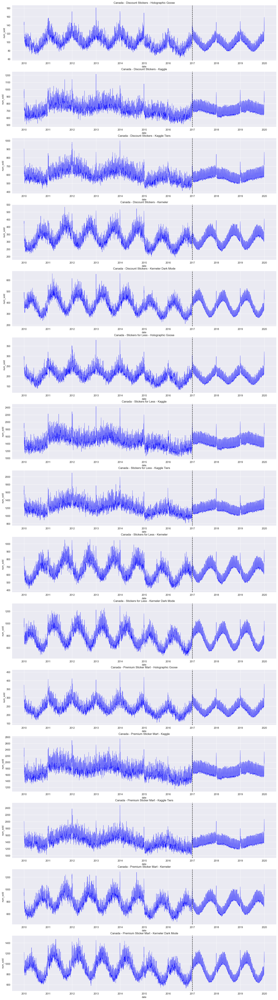

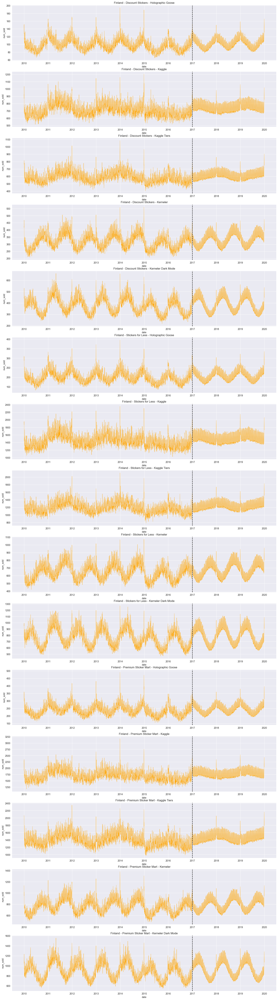

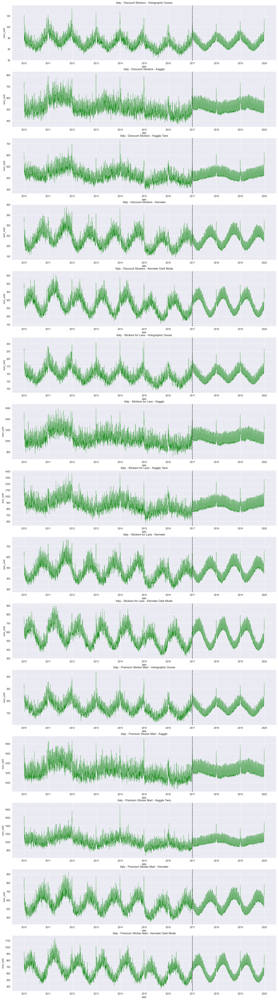

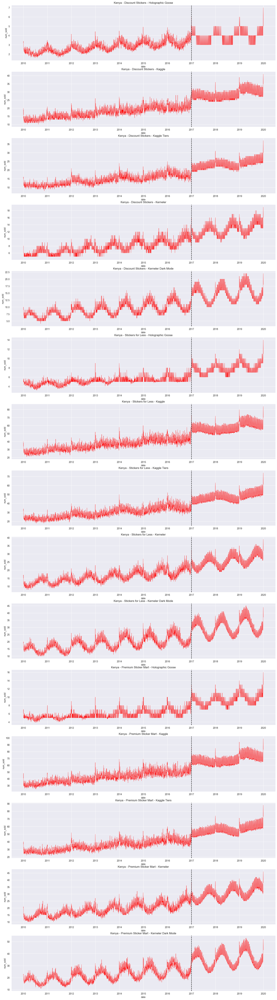

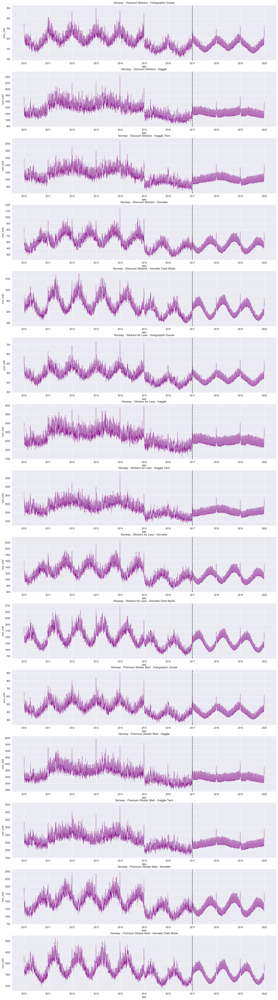

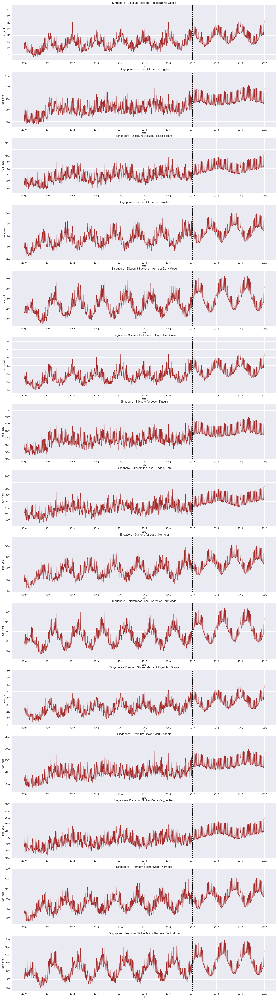

In [54]:
plot_individual_ts(pd.concat([original_train_df_imputed,test_sub_df]).reset_index(drop=True))

# **Submission**

,id,num_sold
0,230130,149.0
1,230131,971.0
